## Best Spot to Open a Cafe or Restaurant in Washington DC

### Introduction / Business Problem

In this project, I will combine Washington DC census tract data that gives the population and median income for neighborhoods in Washington DC with location data from Foursquare on the number of cafes and restaurants in each neighborhood. If an entrepreneur is interested in opening a cafe or restaurant, they would likely be interested in knowing which neighborhoods have fewer establishments than average, considering their population and median income. If an entrepreneur can find a neighborhood with a high population and high median income, but fewer competitors than expected, then this could be an ideal place to begin searching for a place to open up a new business. 

### Data

I will be using the 2010 Census Tract data from Washington DC, which gives the census tract number, total population, and median income for each census tract in Washington DC. The data set also includes a set of coordinates that outline the border of each census tract, and I will use these coordinates to find the central point (or at least, a central point) of each census tract. This central point will then be used as the central point for drawing the radius to gather data on cafes and restaurants in the areas through the Foursquare API.

2010 Census Tract Data with border coordinates for each census tract: https://raw.githubusercontent.com/benbalter/dc-maps/master/maps/census-tracts-2010.geojson

Data on census tracts and the Foursquare data has been downloaded and prepared below.

In [64]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


In [65]:
!wget -q -O 'dc_data.json' https://raw.githubusercontent.com/benbalter/dc-maps/master/maps/census-tracts-2010.geojson
print('Data downloaded!')

Data downloaded!


In [66]:
with open('dc_data.json') as json_data:
    dc_data = json.load(json_data)

In [67]:
#calculate the center of each district based on the coordinates of the borders
# method suggested at: https://stackoverflow.com/questions/3081021/how-to-get-the-center-of-a-polygon-in-google-maps-v3
def get_center_of_district(district):
    lats_list = []
    longs_list = []
    for element in district:
        longs_list.append(element[0])
        lats_list.append(element[1])
    lat_max = max(lats_list)
    lat_min = min(lats_list)
    long_max = max(longs_list)
    long_min = min(longs_list)
    central_lat = (lat_max + lat_min) / 2
    central_long = (long_max + long_min) / 2
    return central_long, central_lat

In [68]:
column_names = ['tract_id', 'total_pop', 'median_income', 'long', 'lat']
df_dcdata = pd.DataFrame(columns=column_names)
df_dcdata

,tract_id,total_pop,median_income,long,lat


In [69]:
#populate dataframe with needed data, including the center of each census tract
for i in range(0,len(dc_data['features'])):
    tract_id = dc_data['features'][i]['properties']['TRACT']
    tot_pop = dc_data['features'][i]['properties']['P0010001']
    med_income = dc_data['features'][i]['properties']['FAGI_MEDIAN_2010']
    lst_coords = dc_data['features'][i]['geometry']['coordinates'][0]
    mid_longitude, mid_latitude = get_center_of_district(lst_coords)
    df_dcdata = df_dcdata.append({'tract_id': tract_id,
                                          'total_pop': tot_pop,
                                          'median_income': med_income,
                                            'long': mid_longitude,
                                             'lat': mid_latitude}, ignore_index=True)

In [70]:
df_dcdata.head()

,tract_id,total_pop,median_income,long,lat
0,001001,7436,114136.5,-77.089557,38.949481
1,001002,3442,74658.0,-77.079024,38.939686
2,004001,3745,72807.0,-77.046452,38.919678
3,004002,2797,60460.5,-77.043998,38.918528
4,004100,2708,87019.0,-77.052629,38.915475


In [71]:
address = 'Washington, DC'

geolocator = Nominatim(user_agent="dc_explorer")
location = geolocator.geocode(address)
print(type(location))

<class 'geopy.location.Location'>


In [72]:
latitude = location.latitude
longitude = location.longitude
print('The geographical coordinates of Washington DC are {}, {}.'.format(latitude, longitude))

The geographical coordinates of Washington DC are 38.8949855, -77.0365708.


In [73]:
# create map of Washington DC using latitude and longitude values
map_dc = folium.Map(location=[latitude, longitude], zoom_start=10)

# generate choropleth map using the median income of each tract, to show the boundaries of each district. 
# This uses the data for the boundaries of each census tract that were included in the geojson file.
map_dc.choropleth(
    geo_data=dc_data,
    data=df_dcdata,
    columns=['tract_id', 'median_income'],
    key_on='feature.properties.TRACT',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Median Income by Neighborhood'
)

# add markers to show the median income and population for each census tract on the map
# markers are color coded to show the population category of each census tract
for lat, lng, tract, med_income, total_pop in zip(df_dcdata['lat'], df_dcdata['long'], df_dcdata['tract_id'], df_dcdata['median_income'], df_dcdata['total_pop']):
    label = 'Tract: {}, Median Income: {}, Population: {}'.format(tract, med_income, total_pop)
    label = folium.Popup(label, parse_html=True)
    marker_color = ''
    filling_color = ''
    if total_pop < 3500:
        marker_color = 'red'
        filling_color = 'lightred'
    elif total_pop < 6000:
        marker_color = 'green'
        filling_color = 'lightgreen'
    else:
        marker_color = 'blue'
        filling_color = 'lightblue'
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=marker_color,
        fill=True,
        fill_color=filling_color,
        fill_opacity=0.7,
        parse_html=False).add_to(map_dc)  
    
map_dc

#### Define Foursquare Credentials and download data on venues by census tract

In [74]:
CLIENT_ID = 'YFH5AOLVXR0NVCA0D5MPBFKLXZ1ST1X2VH3ER45JIGHIVFZN' # your Foursquare ID
CLIENT_SECRET = 'VEDKRJA3CMXT1D04TWLDRABSXU3YJLWF1G34NKW1I4AEFUA0' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: YFH5AOLVXR0NVCA0D5MPBFKLXZ1ST1X2VH3ER45JIGHIVFZN
CLIENT_SECRET:VEDKRJA3CMXT1D04TWLDRABSXU3YJLWF1G34NKW1I4AEFUA0


#### Define a function to download the data on nearby venues within a 500 meter radius of the center of the census tract

In [75]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

def getNearbyVenues(tract_ids, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for tract_id, lat, lng in zip(tract_ids, latitudes, longitudes):
         
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            tract_id, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Tract_id', 
                  'Tract Center Lat', 
                  'Tract Center Long', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [76]:
dc_venues = getNearbyVenues(tract_ids=df_dcdata['tract_id'],
                                   latitudes=df_dcdata['lat'],
                                   longitudes=df_dcdata['long']
                                  )

In [77]:
print(dc_venues.shape)
dc_venues.head()

(4002, 7)


,Tract_id,Tract Center Lat,Tract Center Long,Venue,Venue Latitude,Venue Longitude,Venue Category
0,001002,38.939686,-77.079024,Red Hook Lobster Pound DC,38.939513,-77.078287,Food Truck
1,001002,38.939686,-77.079024,The Spa Room,38.942982,-77.076708,Massage Studio
2,001002,38.939686,-77.079024,Sullivan's Toy Store,38.943748,-77.077712,Toy / Game Store
3,001002,38.939686,-77.079024,Feelin' Crabby,38.939441,-77.075230,Food Truck
4,001002,38.939686,-77.079024,Bourbon Coffee,38.943671,-77.077613,Coffee Shop


In [78]:
#Check how many venues were returned for each census tract
dc_venues.groupby('Tract_id').count().head()

,Tract Center Lat,Tract Center Long,Venue,Venue Latitude,Venue Longitude,Venue Category
Tract_id,,,,,,
000100,51,51,51,51,51,51
000201,22,22,22,22,22,22
000202,28,28,28,28,28,28
000300,18,18,18,18,18,18
000400,3,3,3,3,3,3


In [79]:
#See how many unique categories there are: 
print('There are {} unique categories.'.format(len(dc_venues['Venue Category'].unique())))

There are 321 unique categories.


#### Now use one-hot encoding to isolate the number of cafes and restaurants in each tract

In [80]:
# one hot encoding
dc_onehot = pd.get_dummies(dc_venues[['Venue Category']], prefix="", prefix_sep="")

# add tract_id column back to dataframe
dc_onehot['Tract_id'] = dc_venues['Tract_id'] 

# move tract_id column to the first column
fixed_columns = [dc_onehot.columns[-1]] + list(dc_onehot.columns[:-1])
dc_onehot = dc_onehot[fixed_columns]

dc_onehot.head()

,Tract_id,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Clothing Store,Cocktail Bar,Coffee Shop,College Administrative Building,College Arts Building,College Library,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Courthouse,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Heliport,Historic Site,History Museum,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roller Rink,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,State / Provincial Park,Stationery Store,Steakhouse,Stor

#### Now let's sum the number of each type of establishment in each census tract

In [81]:
dc_grouped = dc_onehot.groupby('Tract_id').sum().reset_index()
dc_grouped.head()

,Tract_id,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Clothing Store,Cocktail Bar,Coffee Shop,College Administrative Building,College Arts Building,College Library,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Courthouse,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Heliport,Historic Site,History Museum,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roller Rink,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,State / Provincial Park,Stationery Store,Steakhouse,Stor

In [82]:
dc_grouped['Total_cafes'] = dc_grouped['Café'] + dc_grouped['Coffee Shop']
dc_grouped.head()

,Tract_id,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Clothing Store,Cocktail Bar,Coffee Shop,College Administrative Building,College Arts Building,College Library,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Courthouse,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Heliport,Historic Site,History Museum,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roller Rink,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,State / Provincial Park,Stationery Store,Steakhouse,Stor

In [83]:
restaurant_columns = [x for x in dc_grouped.columns if 'Restaurant' in x]

In [84]:
#Define a function to add up the total number of restaurants in each census tract. 
def add_restaurants(df):
    total = 0
    restaurant_columns = [x for x in df.columns if 'Restaurant' in x]
    for item in restaurant_columns:
        total += df[item]
    return total

In [85]:
dc_grouped['Total_restaurants'] = (add_restaurants(dc_grouped))
dc_grouped.head()

,Tract_id,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Basketball Stadium,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Clothing Store,Cocktail Bar,Coffee Shop,College Administrative Building,College Arts Building,College Library,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Courthouse,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Heliport,Historic Site,History Museum,Hockey Field,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Pakistani Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roller Rink,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,State / Provincial Park,Stationery Store,Steakhouse,Stor

In [86]:
# filter out columns we don't want
filter_columns = [dc_grouped.columns[0]] + list(dc_grouped.columns[-2:])
dc_grouped_2 = dc_grouped[filter_columns]
dc_grouped_2.head()

,Tract_id,Total_cafes,Total_restaurants
0,000100,3,14
1,000201,6,0
2,000202,5,1
3,000300,1,5
4,000400,0,0


### Now that we have the total cafes and restaurants for each census tract, we can merge this with the population and median income for each tract.

In [87]:
df_full = pd.merge(df_dcdata, dc_grouped_2, left_on='tract_id', right_on='Tract_id', how='inner')
df_full.head()

,tract_id,total_pop,median_income,long,lat,Tract_id,Total_cafes,Total_restaurants
0,001002,3442,74658.0,-77.079024,38.939686,001002,2,2
1,004001,3745,72807.0,-77.046452,38.919678,004001,7,18
2,004002,2797,60460.5,-77.043998,38.918528,004002,6,27
3,004100,2708,87019.0,-77.052629,38.915475,004100,0,1
4,004201,3342,59325.0,-77.039077,38.916625,004201,1,18


In [88]:
df_full_2 = df_full[['tract_id','total_pop','median_income','long','lat','Total_cafes','Total_restaurants']].copy()
df_full_2.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants
0,001002,3442,74658.0,-77.079024,38.939686,2,2
1,004001,3745,72807.0,-77.046452,38.919678,7,18
2,004002,2797,60460.5,-77.043998,38.918528,6,27
3,004100,2708,87019.0,-77.052629,38.915475,0,1
4,004201,3342,59325.0,-77.039077,38.916625,1,18


#### Assuming a linear relationship between population, income and the number of cafes that can be supported in a neighborhood, let's predict the number of cafes in each neighborhood using these data.

In [89]:
import matplotlib.pyplot as plt
import pylab as pl
%matplotlib inline

#### Look first at the scatter plots showing the relationship between median income and number of cafes and restaurants

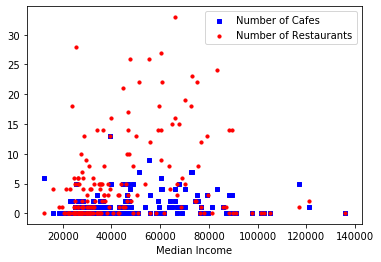

In [90]:
y = df_full_2.Total_cafes
z = df_full_2.Total_restaurants
x = df_full_2.median_income
fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes')
ax1.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants')
plt.legend(loc='upper right')
plt.xlabel('Median Income')
plt.show()

#### Now lets look at the relationships between population and the number of cafes and restaurants

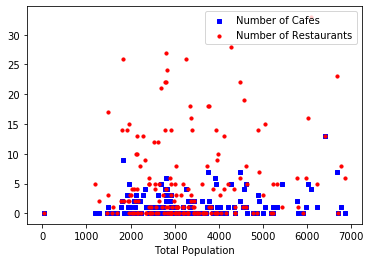

In [91]:
y = df_full_2.Total_cafes
z = df_full_2.Total_restaurants
x = df_full_2.total_pop
fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes')
ax1.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants')
plt.legend(loc='upper right')
plt.xlabel('Total Population')
plt.show()

### Insights from initial data exploration
We can see that there appears to be a positive relationship between the total population and the number of restaurants. However, there are still some strange results, such as that some census tracts with thousands of people, or with very high income, appear to have no restaurants or cafes. This would require closer examination.

Problem 1) Some communities have very high income but 0 restaurants or cafes. After examining the map above, it seems that the wealthiest communities are also suburban communities near the border of the city. Because of zoning laws, it is probably prohibited to open cafes or restaurants in these neighborhoods. They should be dropped from the analysis to avoid biasing the results.

Problem 2) Some communities have a high total population but zero cafes or restaurants. This could be because of the method of choosing the central point of each census tract. In some cases, this has resulted in the central point being placed in a park or some other place that would not be near to many cafes. Then, when the Foursquare API was called to collect data on nearby cafes and restaurants within a 500 meter radius of the central point, then no establishments were returned.

Let's plot this data on a folium map and add the population, median income number of cafes, and number of restaurants to each marker.

### Map median income and number of cafes and restaurants
First, we use a chloropleth map to show the median income in each census tract. Then we overlay markers that are color-coded to show the number of cafes in the area. Red markers show that there are fewer than 2 cafes within 500 meters of the census tract center. Green markers show there are 2-4 cafes within the 500 meter radius. Blue markers show there are 4 or more cafes.

In [93]:
# generate choropleth map using the median income of each tract, to show the boundaries of each district. 
# This uses the data for the boundaries of each census tract that were included in the geojson file.
# The method for finding the centerpoint of each district has generally worked well, but some of the points have not been placed optimally so this will need to be considered in the analysis.

# create map of Washington DC using latitude and longitude values
map_dc_2 = folium.Map(location=[latitude, longitude], zoom_start=10)

map_dc_2.choropleth(
    geo_data=dc_data,
    data=df_dcdata,
    columns=['tract_id', 'median_income'],
    key_on='feature.properties.TRACT',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Median Income in Washington DC'
)

# add markers to map
for lat, lng, tract, med_income, total_pop, num_cafs, num_restos in zip(df_full_2['lat'], df_full_2['long'], df_full_2['tract_id'], df_full_2['median_income'], df_full_2['total_pop'], df_full_2['Total_cafes'], df_full_2['Total_restaurants']):
    label = '{tract}, Inc:{med_income}, Pop:{total_pop}, Cafes:{num_cafs}, Rests:{num_restos}'.format(tract=tract, med_income=med_income, total_pop=total_pop, num_cafs=num_cafs, num_restos=num_restos)
    label = folium.Popup(label, parse_html=True)
    marker_color = ''
    filling_color = ''
    if num_cafs < 2:
        marker_color = 'red'
        filling_color = 'lightred'
    elif num_cafs >= 2 and num_cafs < 4:
        marker_color = 'green'
        filling_color = 'lightgreen'
    else:
        marker_color = 'blue'
        filling_color = 'lightblue'
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=marker_color,
        fill=True,
        fill_color=filling_color,
        fill_opacity=0.7,
        parse_html=False).add_to(map_dc_2)  
    
map_dc_2

From this map, we can see a few interesting areas that have a relatively high median income (shaded orange) but also have few cafes (red marker). While a closer look shows that some of these areas may be residential and it many not be possible to open a cafe there (in the northwest, for example), it shows that there are many neighborhoods in the northeast that appear to have relatively dense populations and fairly high incomes. These could be interesting areas to explore opening a cafe. In addition, there are some neighborhoods close to the city center, in the area near Dupont Circle especially, where there are very few cafes. This is surprising as some of these tracts are surrounded by other tracts with high numbers of cafes. Moreover, clicking on the labels shows that these neighborhoods also have a high number of restaurants, and fairly high populations and incomes. These neighborhoods could also be interesting areas to investigate opening a cafe.

### Data Selection
To eliminate some outliers from the data, I will first drop census tracts that have fewer than 2 total cafes and restaurants within 500 meters of their centroid. I will assume that this very low number of cafes or restaurants indicates that the centroid has been placed in a residential area, a park, or some other place that is biasing the results.

In [94]:
df_full_2.shape

(173, 7)

In [95]:
df_full_3 = df_full_2.copy()

In [96]:
df_full_3 = df_full_3[(df_full_3.Total_cafes + df_full_3.Total_restaurants) > 2]
df_full_3.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants
0,001002,3442,74658.0,-77.079024,38.939686,2,2
1,004001,3745,72807.0,-77.046452,38.919678,7,18
2,004002,2797,60460.5,-77.043998,38.918528,6,27
4,004201,3342,59325.0,-77.039077,38.916625,1,18
5,004202,2771,60675.0,-77.042723,38.913469,4,22


In [97]:
df_full_3.shape

(92, 7)

#### After dropping census tracts that had 2 or fewer total cafes and restaurants, I again plot the number of cafes and restaurants against median income and population.

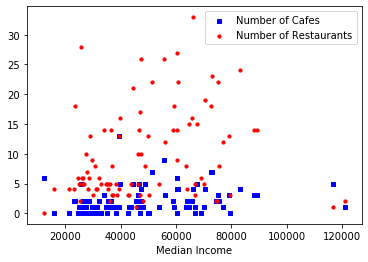

In [98]:
y = df_full_3.Total_cafes
z = df_full_3.Total_restaurants
x = df_full_3.median_income
fig = plt.figure()
ax1 = fig.add_subplot(111)

ax1.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes')
ax1.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants')
plt.legend(loc='upper right')
plt.xlabel('Median Income')
plt.show()

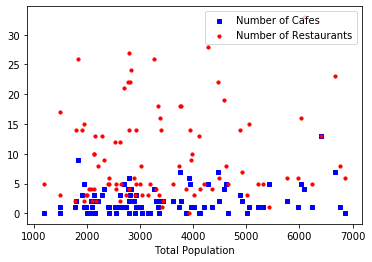

In [99]:
y = df_full_3.Total_cafes
z = df_full_3.Total_restaurants
x = df_full_3.total_pop
fig = plt.figure()
ax2 = fig.add_subplot(111)

ax2.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes')
ax2.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants')
plt.legend(loc='upper right')
plt.xlabel('Total Population')
plt.show()

#### Finally, I will cut out outliers with an extremely high median income (greater than $100,000)

In [100]:
df_full_3 = df_full_3[df_full_3.median_income < 100000]
df_full_3.shape

(90, 7)

### Multiple Regression
Now, I will use multiple regression to predict the numer of cafes and restaurants that there should be in each neighborhood, considering their median income and population. Using the predicted values, I will then sort the neighborhoods to see which has the largest negative deviation from the predicted value. These would seem to be the neighborhoods where the market for cafes or restaurants is not saturated, meaning that they would be good places to investigate opening a cafe or restaurant. Of course, there may be additional factors not captured by the predictive model, and there were already some issues with the data encoding discussed earlier. However, the neighborhoods I list should be a good way to begin the search for a location.

#### First, normalize the median income and population data so that their impact on the dependent variable is similarly weighted.

Next, define our independent variables series as X, and dependent variable series as y.

In [101]:
#Split the data set into a training and testing set
msk = np.random.rand(len(df_full_3)) < 0.8
train = df_full_3[msk]
test = df_full_3[~msk]

In [102]:
print(train.shape)
print(test.shape)

(74, 7)
(16, 7)


#### First, we can check the impact of population and income on the number of cafes

In [103]:
#Train the model using the training data
from sklearn import linear_model
regr_cafes = linear_model.LinearRegression()
x = np.asanyarray(train[['total_pop','median_income']])
y = np.asanyarray(train[['Total_cafes']])
regr_cafes.fit(x, y)
# The coefficients
print ('Coefficients: ', regr_cafes.coef_)

Coefficients:  [[5.39193043e-04 1.65310925e-05]]


In [104]:
#Create predicted values for the test data
y_hat= regr_cafes.predict(test[['total_pop','median_income']])
y_test = np.asanyarray(test[['Total_cafes']])

In [105]:
#Evaluate model accuracy
from sklearn.metrics import r2_score

print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y_test) ** 2))

# Explained variance score: 1 is perfect prediction
#print('Variance score: %.2f' % regr_cafes.score(x, y))

#R2 score - Ranges between 0 and 1. Closer to 1 is better
print("R2-score: %.2f" % r2_score(y_hat , y_test))

Residual sum of squares: 7.98
R2-score: -12.42


### Let's examine the number of cafes predicted vs the number of actual cafes in the test set, considering population of each census tract. Then, I will plot the same values against median income per census tract.

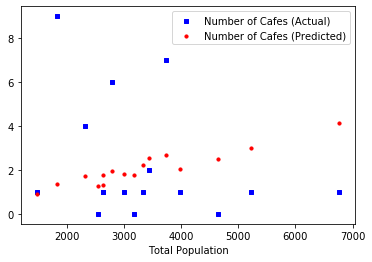

In [106]:
y = test.Total_cafes
z = y_hat
x = test.total_pop
fig = plt.figure()
ax3 = fig.add_subplot(111)

ax3.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes (Actual)')
ax3.scatter(x, z, s=10, c='r', marker="o", label='Number of Cafes (Predicted)')
plt.legend(loc='upper right')
plt.xlabel('Total Population')
plt.show()


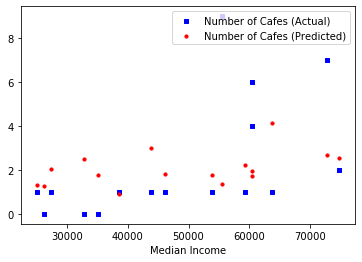

In [107]:
y = test.Total_cafes
z = y_hat
x = test.median_income
fig = plt.figure()
ax4 = fig.add_subplot(111)

ax4.scatter(x, y, s=10, c='b', marker="s", label='Number of Cafes (Actual)')
ax4.scatter(x, z, s=10, c='r', marker="o", label='Number of Cafes (Predicted)')
plt.legend(loc='upper right')
plt.xlabel('Median Income')
plt.show()


Overall, the model does not achieve very good predictive accuracy. This indicates that there are likely many other factors that determine the number of cafes in a neighborhood. These could include proximity to metro stations, universities, or other places where many people gather together during the day but few people live. Still, we can calculate in which neighborhoods the number of actual cafes differs the most from the number of predicted cafes to get an idea of which neighborhoods may be able to support more cafes.

In [108]:
# use the regression model to predict the y values for the whole sample
y_hat_full = regr_cafes.predict(df_full_3[['total_pop','median_income']])

In [109]:
df_full_3['Predicted_cafes'] = y_hat_full
df_full_3.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants,Predicted_cafes
0,001002,3442,74658.0,-77.079024,38.939686,2,2,2.543655
1,004001,3745,72807.0,-77.046452,38.919678,7,18,2.676432
2,004002,2797,60460.5,-77.043998,38.918528,6,27,1.961175
4,004201,3342,59325.0,-77.039077,38.916625,1,18,2.236265
5,004202,2771,60675.0,-77.042723,38.913469,4,22,1.950702


In [110]:
df_full_3['Cafes_variation'] = df_full_3['Total_cafes'] - df_full_3['Predicted_cafes']
df_full_3.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants,Predicted_cafes,Cafes_variation
0,001002,3442,74658.0,-77.079024,38.939686,2,2,2.543655,-0.543655
1,004001,3745,72807.0,-77.046452,38.919678,7,18,2.676432,4.323568
2,004002,2797,60460.5,-77.043998,38.918528,6,27,1.961175,4.038825
4,004201,3342,59325.0,-77.039077,38.916625,1,18,2.236265,-1.236265
5,004202,2771,60675.0,-77.042723,38.913469,4,22,1.950702,2.049298


### Now, sort the dataframe by 'Cafes_variation' to find the neighborhoods that have the biggest difference between the number of predicted cafes and actual cafes. 
These neighborhoods would appear to have the least saturated market, and could be good places to consider opening a cafe.

In [111]:
df_full_3.sort_values(by=['Cafes_variation'], ascending=True, inplace=True)
df_full_3.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants,Predicted_cafes,Cafes_variation
11,001302,6857,68999.0,-77.056785,38.939814,0,6,4.291450,-4.291450
9,001200,5008,79665.0,-77.070273,38.947413,0,3,3.470803,-3.470803
51,005600,6756,63663.0,-77.054358,38.898776,1,8,4.148782,-3.148782
27,000300,6233,66914.5,-77.075761,38.917573,1,5,3.920534,-2.920534
126,002102,4648,32803.0,-77.014489,38.956148,0,5,2.502013,-2.502013


### This gives us the list of the places that may be the most promising for opening a new. 
We can re-plot the markers on the map to show the neighborhoods with the largest negative 'Cafes_variation', which could be the first ones to explore while searching for a place to open a cafe.

On the map below, neighborhoods with blue markers have at least 2 fewer cafes than predicted by the model. Those with green markers have at least one fewer cafe, and those with blue markers have between 0 and 1 fewer cafes than predicted (the model can predict a non-integer number of cafes). Those neighborhoods with white markers have as many cafes or more than the number predicted by the model, so they would likely not be the best places to start looking to open a new cafe.

In [112]:
map_dc_cafes = folium.Map(location=[latitude, longitude], zoom_start=10)

map_dc_cafes.choropleth(
    geo_data=dc_data,
    data=df_dcdata,
    columns=['tract_id', 'median_income'],
    key_on='feature.properties.TRACT',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Median Income in Washington DC'
)
# add markers to map
for lat, lng, tract, med_income, total_pop, num_cafs, num_restos, cafes_dif in zip(df_full_3['lat'], df_full_3['long'], df_full_3['tract_id'], df_full_3['median_income'], df_full_3['total_pop'], df_full_3['Total_cafes'], df_full_3['Total_restaurants'], df_full_3['Cafes_variation']):
    label = '{tract}, Inc:{med_income}, Pop:{total_pop}, Cafes:{num_cafs}, Rests:{num_restos}'.format(tract=tract, med_income=med_income, total_pop=total_pop, num_cafs=num_cafs, num_restos=num_restos)
    label = folium.Popup(label, parse_html=True)
    marker_color = ''
    filling_color = ''
    if cafes_dif < -2.0:
        marker_color = 'blue'
        filling_color = 'lightblue'
    elif cafes_dif < -1.0:
        marker_color = 'green'
        filling_color = 'lightgreen'
    elif cafes_dif < 0:
        marker_color = 'red'
        filling_color = 'lightred'
    else:
        marker_color = 'white'
        filling_color = 'white'
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=marker_color,
        fill=True,
        fill_color=filling_color,
        fill_opacity=0.7,
        parse_html=False).add_to(map_dc_cafes)  
    
map_dc_cafes

#### Next, we can try the same analysis with the number of restaurants

In [113]:
regr_restos = linear_model.LinearRegression()
x = np.asanyarray(train[['total_pop','median_income']])
y = np.asanyarray(train[['Total_restaurants']])
regr_restos.fit (x, y)
# The coefficients
print ('Coefficients: ', regr_restos.coef_)

Coefficients:  [[0.00094103 0.00013663]]


In [114]:
y_hat_restos = regr_restos.predict(test[['total_pop','median_income']])
x = np.asanyarray(test[['total_pop','median_income']])
y = np.asanyarray(test[['Total_restaurants']])

In [115]:
#Evaluate model accuracy

print("Residual sum of squares: %.2f"
      % np.mean((y_hat_restos - y) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr_restos.score(x, y))

#R2 score - Ranges between 0 and 1. Closer to 1 is better
print("R2-score: %.2f" % r2_score(y_hat_restos , y))

Residual sum of squares: 57.61
Variance score: 0.08
R2-score: -7.41


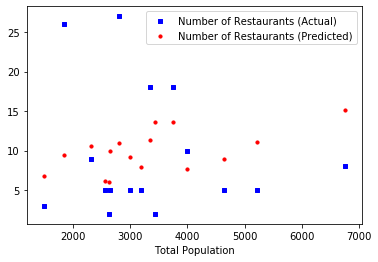

In [116]:
y = test.Total_restaurants
z = y_hat_restos
x = test.total_pop
fig = plt.figure()
ax5 = fig.add_subplot(111)

ax5.scatter(x, y, s=10, c='b', marker="s", label='Number of Restaurants (Actual)')
ax5.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants (Predicted)')
plt.legend(loc='upper right')
plt.xlabel('Total Population')
plt.show()

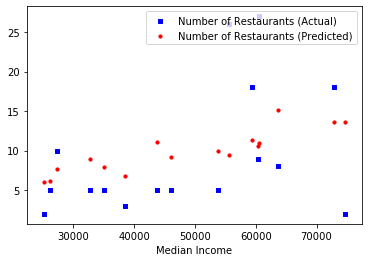

In [117]:
y = test.Total_restaurants
z = y_hat_restos
x = test.median_income
fig = plt.figure()
ax6 = fig.add_subplot(111)

ax6.scatter(x, y, s=10, c='b', marker="s", label='Number of Restaurants (Actual)')
ax6.scatter(x, z, s=10, c='r', marker="o", label='Number of Restaurants (Predicted)')
plt.legend(loc='upper right')
plt.xlabel('Median Income')
plt.show()


In [118]:
# use the regression model to predict the y values for the whole sample
y_hat_restos = regr_restos.predict(df_full_3[['total_pop','median_income']])

In [119]:
df_full_3['Predicted_restaurants'] = y_hat_restos
df_full_3['Restaurants_variation'] = df_full_3['Total_restaurants'] - df_full_3['Predicted_restaurants']
df_full_3.sort_values(by=['Restaurants_variation'], ascending=True, inplace=True)
df_full_3.reset_index(drop=True, inplace=True)

In [120]:
df_full_3.head()

,tract_id,total_pop,median_income,long,lat,Total_cafes,Total_restaurants,Predicted_cafes,Cafes_variation,Predicted_restaurants,Restaurants_variation
0,001200,5008,79665.0,-77.070273,38.947413,0,3,3.470803,-3.470803,15.724898,-12.724898
1,001002,3442,74658.0,-77.079024,38.939686,2,2,2.543655,-0.543655,13.567114,-11.567114
2,006900,2179,74417.0,-76.988708,38.883352,2,2,1.858670,0.141330,12.345663,-10.345663
3,000300,6233,66914.5,-77.075761,38.917573,1,5,3.920534,-2.920534,15.135505,-10.135505
4,001302,6857,68999.0,-77.056785,38.939814,0,6,4.291450,-4.291450,16.007523,-10.007523


We can now re-plot the markers on the map to show the neighborhoods with the largest negative 'Restaurants_variation', which could be the first ones to explore while searching for a place to open a restaurant.

On the map below, neighborhoods with purple markers have at least 7 fewer restaurants than predicted by the model. Those with green markers have at least three fewer, and those with blue markers have between 0 and 3 fewer restaurants than predicted. Those neighborhoods with white markers have as many restaurants or more than the number predicted by the model, so they would likely not be the best places to start looking to open a new one.

In [121]:
map_dc_restos = folium.Map(location=[latitude, longitude], zoom_start=10)

map_dc_restos.choropleth(
    geo_data=dc_data,
    data=df_dcdata,
    columns=['tract_id', 'median_income'],
    key_on='feature.properties.TRACT',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Median Income in Washington DC'
)
# add markers to map
for lat, lng, tract, med_income, total_pop, num_cafs, num_restos, restos_dif in zip(df_full_3['lat'], df_full_3['long'], df_full_3['tract_id'], df_full_3['median_income'], df_full_3['total_pop'], df_full_3['Total_cafes'], df_full_3['Total_restaurants'], df_full_3['Restaurants_variation']):
    label = '{tract}, Inc:{med_income}, Pop:{total_pop}, Cafes:{num_cafs}, Rests:{num_restos}'.format(tract=tract, med_income=med_income, total_pop=total_pop, num_cafs=num_cafs, num_restos=num_restos)
    label = folium.Popup(label, parse_html=True)
    marker_color = ''
    if restos_dif < -7.0:
        marker_color = 'purple'
    elif restos_dif < -3.0:
        marker_color = 'green'
    elif restos_dif < 0:
        marker_color = 'orange'
    else:
        marker_color = 'white'
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=marker_color,
        fill=True,
        fill_color='white',
        fill_opacity=0.7,
        parse_html=False).add_to(map_dc_restos)  
    
map_dc_restos